# Functions for feature engineering
1. missing_zero_values_table : remove the null value columns if % is more
2. get_zero_cols: remove the columns with stats value is 0 for more than 4 stats
3. Multicolinearity class to remove multicolinear featurs

In [1]:
def missing_zero_values_table(df):
        zero_val = (df == 0.00).astype(int).sum(axis=0)
        mis_val = df.isnull().sum()
        mis_val_percent = 100 * df.isnull().sum() / len(df)
        mz_table = pd.concat([zero_val, mis_val, mis_val_percent], axis=1)
        mz_table = mz_table.rename(
        columns = {0 : 'Zero Values', 1 : 'Missing Values', 2 : '% of Total Values'})
        mz_table['Total Zero Missing Values'] = mz_table['Zero Values'] + mz_table['Missing Values']
        mz_table['% Total Zero Missing Values'] = 100 * mz_table['Total Zero Missing Values'] / len(df)
        mz_table['Data Type'] = df.dtypes
        mz_table = mz_table[
            mz_table.iloc[:,1] != 0].sort_values(
        '% of Total Values', ascending=False).round(1)
        print ("Your selected dataframe has " + str(df.shape[1]) + " columns and " + str(df.shape[0]) + " Rows.\n"      
            "There are " + str(mz_table.shape[0]) +
              " columns that have missing values.")
        return mz_table
def get_zero_cols(num_df):
    stats_list=["count","mean","min","max","std","25%","50%","75%"]
    column_list=num_df.columns.tolist()
    print(len(column_list))
    zero_cols=[]
    for col in column_list:
        count=0
        for s in stats_list:
            if df_input.describe()[col][s]<=0:
                count+=1
        if count>=4:
            zero_cols.append(col)
    print(zero_cols)
    return zero_cols
    
#Feature selection class to eliminate multicollinearity
class MultiCollinearityEliminator():
    
    #Class Constructor
    def __init__(self, df, target, threshold):
        self.df = df
        self.target = target
        self.threshold = threshold

    #Method to create and return the feature correlation matrix dataframe
    def createCorrMatrix(self, include_target = False):
        #Checking we should include the target in the correlation matrix
        if (include_target == False):
            df_temp = self.df.drop([self.target], axis =1)
            
            #Setting method to Pearson to prevent issues in case the default method for df.corr() gets changed
            #Setting min_period to 30 for the sample size to be statistically significant (normal) according to 
            #central limit theorem
            corrMatrix = df_temp.corr(method='pearson', min_periods=30).abs()
        #Target is included for creating the series of feature to target correlation - Please refer the notes under the 
        #print statement to understand why we create the series of feature to target correlation
        elif (include_target == True):
            corrMatrix = self.df.corr(method='pearson', min_periods=30).abs()
        return corrMatrix

    #Method to create and return the feature to target correlation matrix dataframe
    def createCorrMatrixWithTarget(self):
        #After obtaining the list of correlated features, this method will help to view which variables 
        #(in the list of correlated features) are least correlated with the target
        #This way, out the list of correlated features, we can ensure to elimate the feature that is 
        #least correlated with the target
        #This not only helps to sustain the predictive power of the model but also helps in reducing model complexity
        
        #Obtaining the correlation matrix of the dataframe (along with the target)
        corrMatrix = self.createCorrMatrix(include_target = True)                           
        #Creating the required dataframe, then dropping the target row 
        #and sorting by the value of correlation with target (in asceding order)
        corrWithTarget = pd.DataFrame(corrMatrix.loc[:,self.target]).drop([self.target], axis = 0).sort_values(by = self.target)                    
        print(corrWithTarget, '\n')
        return corrWithTarget.sort_values("total_cases",ascending=False)

    #Method to create and return the list of correlated features
    def createCorrelatedFeaturesList(self):
        #Obtaining the correlation matrix of the dataframe (without the target)
        corrMatrix = self.createCorrMatrix(include_target = False)                          
        colCorr = []
        #Iterating through the columns of the correlation matrix dataframe
        for column in corrMatrix.columns:
            #Iterating through the values (row wise) of the correlation matrix dataframe
            for idx, row in corrMatrix.iterrows():                                            
                if(row[column]>self.threshold) and (row[column]<1):
                    #Adding the features that are not already in the list of correlated features
                    if (idx not in colCorr):
                        colCorr.append(idx)
                    if (column not in colCorr):
                        colCorr.append(column)
        print(colCorr, '\n')
        return colCorr

    #Method to eliminate the least important features from the list of correlated features
    def deleteFeatures(self, colCorr):
        #Obtaining the feature to target correlation matrix dataframe
        corrWithTarget = self.createCorrMatrixWithTarget()                                  
        for idx, row in corrWithTarget.iterrows():
            print(idx, '\n')
            if (idx in colCorr):
                self.df = self.df.drop(idx, axis =1)
                break
        return self.df

    #Method to run automatically eliminate multicollinearity
    def autoEliminateMulticollinearity(self):
        #Obtaining the list of correlated features
        colCorr = self.createCorrelatedFeaturesList()                                       
        while colCorr != []:
            #Obtaining the dataframe after deleting the feature (from the list of correlated features) 
            #that is least correlated with the taregt
            self.df = self.deleteFeatures(colCorr)
            #Obtaining the list of correlated features
            colCorr = self.createCorrelatedFeaturesList()                                     
        return self.df
def concat_df(num_df,cat_df):
     return pd.concat([num_df,cat_df],axis=1)

In [2]:
# import seaborn as sns
# import matplotlib.pyplot as plt
! pip install matplotlib==2.1.1

  Using cached matplotlib-2.1.1.tar.gz (36.1 MB)


    ERROR: Command errored out with exit status 1:
     command: 'C:\Users\suraj\anaconda3\python.exe' -c 'import sys, setuptools, tokenize; sys.argv[0] = '"'"'C:\\Users\\suraj\\AppData\\Local\\Temp\\pip-install-chbhqym4\\matplotlib\\setup.py'"'"'; __file__='"'"'C:\\Users\\suraj\\AppData\\Local\\Temp\\pip-install-chbhqym4\\matplotlib\\setup.py'"'"';f=getattr(tokenize, '"'"'open'"'"', open)(__file__);code=f.read().replace('"'"'\r\n'"'"', '"'"'\n'"'"');f.close();exec(compile(code, __file__, '"'"'exec'"'"'))' egg_info --egg-base 'C:\Users\suraj\AppData\Local\Temp\pip-pip-egg-info-1rf_t0pn'
         cwd: C:\Users\suraj\AppData\Local\Temp\pip-install-chbhqym4\matplotlib\
    Complete output (68 lines):
    Edit setup.cfg to change the build options
    
    BUILDING MATPLOTLIB
                matplotlib: yes [2.1.1]
                    python: yes [3.8.5 (default, Sep  3 2020, 21:29:08) [MSC
                            v.1916 64 bit (AMD64)]]
                  platform: yes [win32]
    
   

# Function to get the final df after feature engineering
1. separate cat df and num df
2. Generate stats to remove outlier for num df 
3. Box plot to remove outlier for cat df and volini plot to remove outlier for num df
4. Remove multi colinear features and remove null columns

In [3]:
def fn__get_final_df(df_input,target_column):
        from sklearn import preprocessing
        cat_df=df_input.select_dtypes(include=[np.object])
        num_df=df_input.select_dtypes(include=[np.number])
        null_list=num_df.columns[num_df.isnull().any()].tolist()
        num_df.drop([col for col in df_input.columns if col in null_list], axis=1, inplace=True)
        zero_cols=get_zero_cols(num_df)
        num_df.drop(zero_cols,axis=1,inplace=True)
        M=MultiCollinearityEliminator(num_df,target_column,0.8)
        num_df=M.autoEliminateMulticollinearity()
        print(num_df.shape)
        cat_null_list=cat_df.columns[cat_df.isnull().any()].tolist()
        cat_df.drop(cat_null_list,axis=1,inplace=True)
        cols_to_remove=[col for col in cat_df.columns.tolist() if len(cat_df[col].unique())>=5]
        cat_df.drop(cols_to_remove,axis=1,inplace=True) 
  
        final_df=concat_df(num_df,cat_df)
        print("final df shape", final_df.shape)
        return final_df
        
        

  


In [30]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
from sklearn.ensemble import GradientBoostingRegressor
from sklearn.metrics import mean_squared_error,r2_score
from sklearn.preprocessing import OneHotEncoder
from sklearn.preprocessing import StandardScaler
from sklearn.model_selection import train_test_split

# Data Preparation
1. Get the data from data frame
2. Join both the data frame to get the final data
3. Impute the columns with mean
4. Apply get_final_df functions to do feature engineering and return df_input

In [5]:
df_feature_train=pd.read_csv("./dengue_features_train.csv")
df_labels_train=pd.read_csv("./dengue_labels_train.csv")
df_test=pd.read_csv("./dengue_features_test.csv")

In [6]:
df_feature_train

,city,year,weekofyear,week_start_date,ndvi_ne,ndvi_nw,ndvi_se,ndvi_sw,precipitation_amt_mm,reanalysis_air_temp_k,...,reanalysis_precip_amt_kg_per_m2,reanalysis_relative_humidity_percent,reanalysis_sat_precip_amt_mm,reanalysis_specific_humidity_g_per_kg,reanalysis_tdtr_k,station_avg_temp_c,station_diur_temp_rng_c,station_max_temp_c,station_min_temp_c,station_precip_mm
0,sj,1990,18,1990-04-30,0.122600,0.103725,0.198483,0.177617,12.42,297.572857,...,32.00,73.365714,12.42,14.012857,2.628571,25.442857,6.900000,29.4,20.0,16.0
1,sj,1990,19,1990-05-07,0.169900,0.142175,0.162357,0.155486,22.82,298.211429,...,17.94,77.368571,22.82,15.372857,2.371429,26.714286,6.371429,31.7,22.2,8.6
2,sj,1990,20,1990-05-14,0.032250,0.172967,0.157200,0.170843,34.54,298.781429,...,26.10,82.052857,34.54,16.848571,2.300000,26.714286,6.485714,32.2,22.8,41.4
3,sj,1990,21,1990-05-21,0.128633,0.245067,0.227557,0.235886,15.36,298.987143,...,13.90,80.337143,15.36,16.672857,2.428571,27.471429,6.771429,33.3,23.3,4.0
4,sj,1990,22,1990-05-28,0.196200,0.262200,0.251200,0.247340,7.52,299.518571,...,12.20,80.460000,7.52,17.210000,3.014286,28.942857,9.371429,35.0,23.9,5.8
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
1451,iq,2010,21,2010-05-28,0.342750,0.318900,0.256343,0.292514,55.30,299.334286,...,45.00,88.765714,55.30,18.485714,9.800000,28.633333,11.933333,35.4,22.4,27.0
1452,iq,2010,22,2010-06-04,0.160157,0.160371,0.136043,0.225657,86.47,298.330000,...,207.10,91.600000,86.47,18.070000,7.471429,27.433333,10.500000,34.7,21.7,36.6
1453,iq,2010,23,2010-06-11,0.247057,0.146057,0.250357,0.233714,58.94,296.598571,...,50.60,94.280000,58.94,17.008571,7.500000,24.400000,6.900000,32.2,19.2,7.4
1454,iq,2010,24,2010-06-18,0.333914,0.245771,0.278886,0.325486,59.67,296.345714,...,62.33,94.660000,59.67,16.815714,7.871429,25.433333,8.733333,31.2,21.0,16.0


In [7]:
df_labels_train

,city,year,weekofyear,total_cases
0,sj,1990,18,4
1,sj,1990,19,5
2,sj,1990,20,4
3,sj,1990,21,3
4,sj,1990,22,6
...,...,...,...,...
1451,iq,2010,21,5
1452,iq,2010,22,8
1453,iq,2010,23,1
1454,iq,2010,24,1


In [8]:
df_input=pd.merge(df_feature_train,df_labels_train,how='right',on=["city","year","weekofyear"])

In [9]:
df_input.isna().sum()

city                                       0
year                                       0
weekofyear                                 0
week_start_date                            0
ndvi_ne                                  194
ndvi_nw                                   52
ndvi_se                                   22
ndvi_sw                                   22
precipitation_amt_mm                      13
reanalysis_air_temp_k                     10
reanalysis_avg_temp_k                     10
reanalysis_dew_point_temp_k               10
reanalysis_max_air_temp_k                 10
reanalysis_min_air_temp_k                 10
reanalysis_precip_amt_kg_per_m2           10
reanalysis_relative_humidity_percent      10
reanalysis_sat_precip_amt_mm              13
reanalysis_specific_humidity_g_per_kg     10
reanalysis_tdtr_k                         10
station_avg_temp_c                        43
station_diur_temp_rng_c                   43
station_max_temp_c                        20
station_mi

In [10]:
df_input.shape

(1456, 25)

In [11]:
# from sklearn.impute import SimpleImputer
# imputer = SimpleImputer(missing_values=np.nan, strategy='mean')
# imputer = imputer.fit(df_input)
  
# df_input = imputer.transform(df_input)
df_input=df_input.fillna(df_input.mean())

In [12]:
df_test=df_test.fillna(df_test.mean())

In [13]:
df_test.isna().sum()
result_test=df_test

In [14]:
df_input=fn__get_final_df(df_input,target_column="total_cases")

C:\Users\suraj\anaconda3\lib\site-packages\pandas\core\frame.py:4163: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  return super().drop(


23
[]
['ndvi_nw', 'ndvi_ne', 'ndvi_sw', 'ndvi_se', 'reanalysis_avg_temp_k', 'reanalysis_air_temp_k', 'reanalysis_specific_humidity_g_per_kg', 'reanalysis_dew_point_temp_k', 'reanalysis_tdtr_k', 'reanalysis_max_air_temp_k', 'station_diur_temp_rng_c', 'reanalysis_min_air_temp_k'] 

                                       total_cases
reanalysis_precip_amt_kg_per_m2           0.010016
precipitation_amt_mm                      0.038670
reanalysis_sat_precip_amt_mm              0.038670
station_max_temp_c                        0.039068
station_precip_mm                         0.074201
station_avg_temp_c                        0.115478
ndvi_se                                   0.117769
reanalysis_specific_humidity_g_per_kg     0.129671
reanalysis_relative_humidity_percent      0.132259
ndvi_sw                                   0.137221
ndvi_nw                                   0.137254
reanalysis_dew_point_temp_k               0.142322
reanalysis_avg_temp_k                     0.151415
ndvi_

C:\Users\suraj\anaconda3\lib\site-packages\pandas\core\frame.py:4163: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  return super().drop(


In [15]:
train_columns=[col for col in df_input.columns.tolist() if col!='total_cases']
df_test=df_test[train_columns]
df_test.shape

(416, 16)

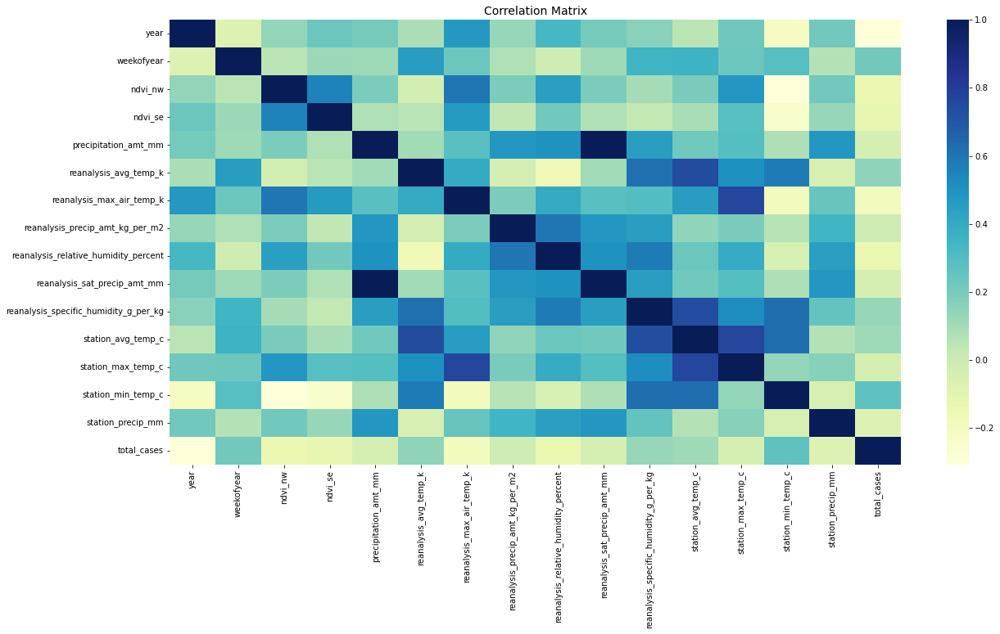

In [16]:

fig, ax = plt.subplots(figsize=(20,10))         
# Imbalanced DataFrame Correlation
corr = df_input.corr()
sns.heatmap(corr, cmap='YlGnBu', annot_kws={'size':30}, ax=ax)
ax.set_title("Correlation Matrix", fontsize=14)
plt.show()

In [17]:
df_input['year'].value_counts()

2001    104
2003    104
2002    104
2007    104
2006    104
2005    104
2004    104
2000     78
2008     69
1991     52
2009     52
1999     52
1998     52
1997     52
1996     52
1995     52
1994     52
1993     52
1992     52
1990     35
2010     26
Name: year, dtype: int64

In [18]:
df_input['weekofyear'].value_counts()

27    28
26    28
24    28
23    28
22    28
21    28
20    28
19    28
18    28
17    28
16    28
15    28
14    28
13    28
12    28
11    28
10    28
9     28
8     28
7     28
6     28
5     28
4     28
3     28
2     28
25    28
1     28
40    28
51    28
49    28
48    28
47    28
46    28
45    28
44    28
43    28
42    28
41    28
28    28
39    28
38    28
37    28
36    28
35    28
34    28
33    28
32    28
31    28
30    28
29    28
50    28
52    23
53     5
Name: weekofyear, dtype: int64

# Exploratory Data Analysis
1. Apply Autoviz package to do EDA and see if any feature transformations required
2. As only feature scaling and one hot encoding is required from the below EDA let's do that before model training

Imported v0.1.58. After importing, execute '%matplotlib inline' to display charts in Jupyter.
    AV = AutoViz_Class()
    dfte = AV.AutoViz(filename, sep=',', depVar='', dfte=None, header=0, verbose=1, lowess=False,
               chart_format='svg',max_rows_analyzed=150000,max_cols_analyzed=30, save_plot_dir=None)
Update: verbose=0 displays charts in your local Jupyter notebook.
        verbose=1 additionally provides EDA data cleaning suggestions. It also displays charts.
        verbose=2 does not display charts but saves them in AutoViz_Plots folder in local machine.
        chart_format='bokeh' displays charts in your local Jupyter notebook.
        chart_format='server' displays charts in your browser: one tab for each chart type
        chart_format='html' silently saves interactive HTML files in your local machine
Shape of your Data Set loaded: (1456, 17)
#######################################################################################
######################## C L A S S 

,Nuniques,dtype,Nulls,Nullpercent,NuniquePercent,Value counts Min,Data cleaning improvement suggestions
ndvi_se,1396,float64,0,0.000000,95.879121,0,
reanalysis_relative_humidity_percent,1371,float64,0,0.000000,94.162088,0,
ndvi_nw,1366,float64,0,0.000000,93.818681,0,
reanalysis_specific_humidity_g_per_kg,1172,float64,0,0.000000,80.494505,0,
precipitation_amt_mm,1158,float64,0,0.000000,79.532967,0,skewed: cap or drop outliers
reanalysis_sat_precip_amt_mm,1158,float64,0,0.000000,79.532967,0,skewed: cap or drop outliers
reanalysis_precip_amt_kg_per_m2,1040,float64,0,0.000000,71.428571,0,skewed: cap or drop outliers
station_precip_mm,664,float64,0,0.000000,45.604396,0,skewed: cap or drop outliers
reanalysis_avg_temp_k,601,float64,0,0.000000,41.277473,0,
station_avg_temp_c,493,float64,0,0.000000,33.859890,0,


    16 Predictors classified...
        No variables removed since no ID or low-information variables found in data set

################ Regression problem #####################
Number of All Scatter Plots = 91
All Plots done
Time to run AutoViz = 11 seconds 

 ###################### AUTO VISUALIZATION Completed ########################


,year,weekofyear,ndvi_nw,ndvi_se,precipitation_amt_mm,reanalysis_avg_temp_k,reanalysis_max_air_temp_k,reanalysis_precip_amt_kg_per_m2,reanalysis_relative_humidity_percent,reanalysis_sat_precip_amt_mm,reanalysis_specific_humidity_g_per_kg,station_avg_temp_c,station_max_temp_c,station_min_temp_c,station_precip_mm,city,total_cases
0,1990,18,0.103725,0.198483,12.42,297.742857,299.8,32.00,73.365714,12.42,14.012857,25.442857,29.4,20.0,16.0,sj,4
1,1990,19,0.142175,0.162357,22.82,298.442857,300.9,17.94,77.368571,22.82,15.372857,26.714286,31.7,22.2,8.6,sj,5
2,1990,20,0.172967,0.157200,34.54,298.878571,300.5,26.10,82.052857,34.54,16.848571,26.714286,32.2,22.8,41.4,sj,4
3,1990,21,0.245067,0.227557,15.36,299.228571,301.4,13.90,80.337143,15.36,16.672857,27.471429,33.3,23.3,4.0,sj,3
4,1990,22,0.262200,0.251200,7.52,299.664286,301.9,12.20,80.460000,7.52,17.210000,28.942857,35.0,23.9,5.8,sj,6
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
1451,2010,21,0.318900,0.256343,55.30,300.771429,309.7,45.00,88.765714,55.30,18.485714,28.633333,35.4,22.4,27.0,iq,5
1452,2010,22,0.160371,0.136043,86.47,299.392857,308.5,207.10,91.600000,86.47,18.070000,27.433333,34.7,21.7,36.6,iq,8
1453,2010,23,0.146057,0.250357,58.94,297.592857,305.5,50.60,94.280000,58.94,17.008571,24.400000,32.2,19.2,7.4,iq,1
1454,2010,24,0.245771,0.278886,59.67,297.521429,306.1,62.33,94.660000,59.67,16.815714,25.433333,31.2,21.0,16.0,iq,1


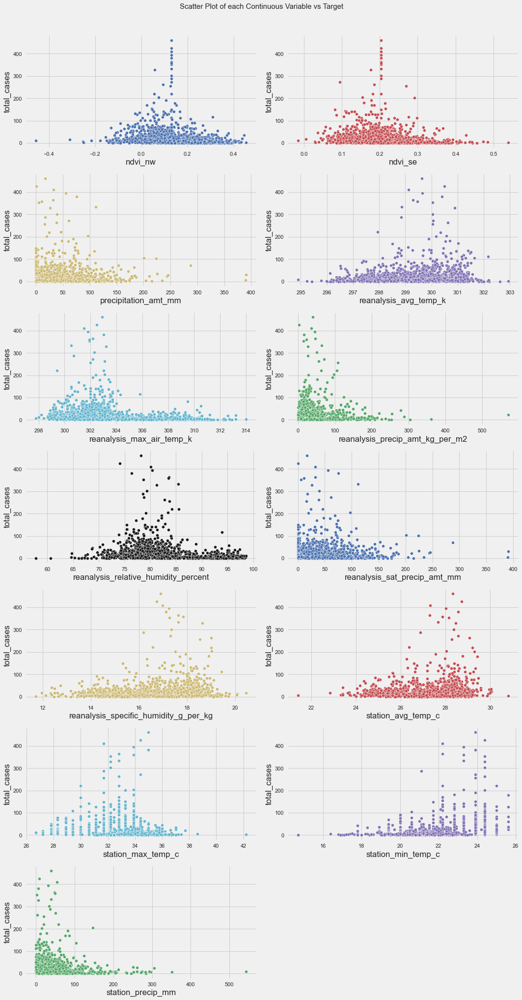

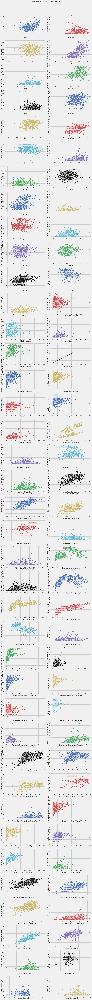

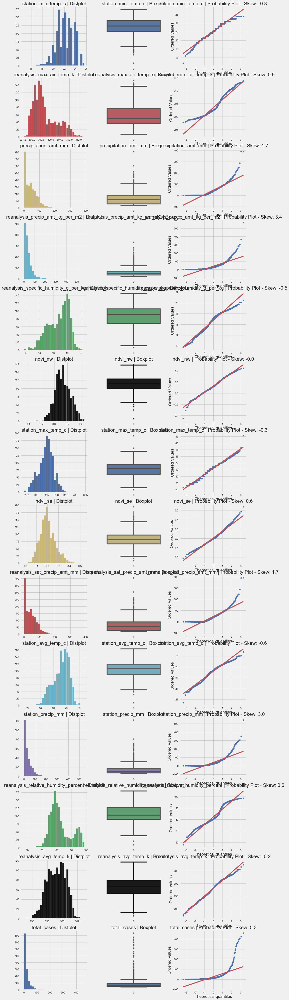

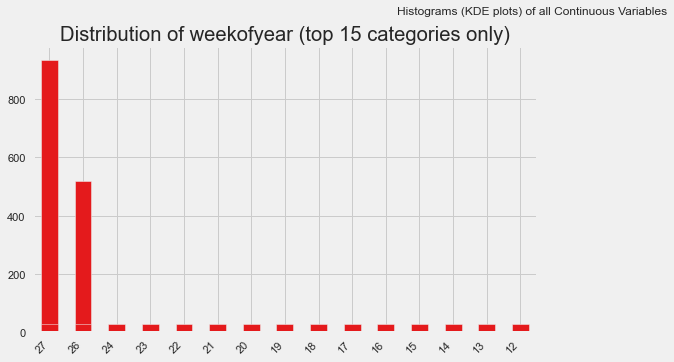

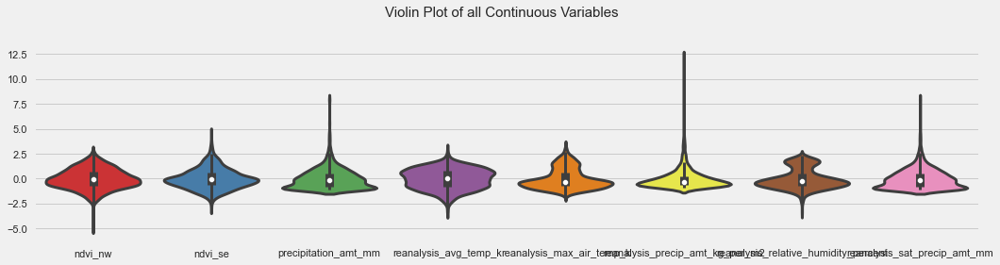

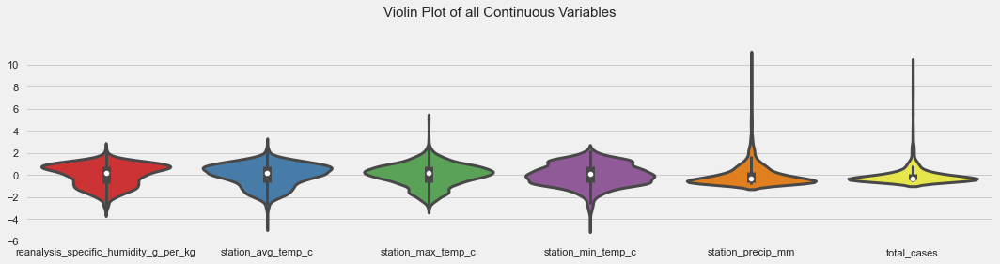

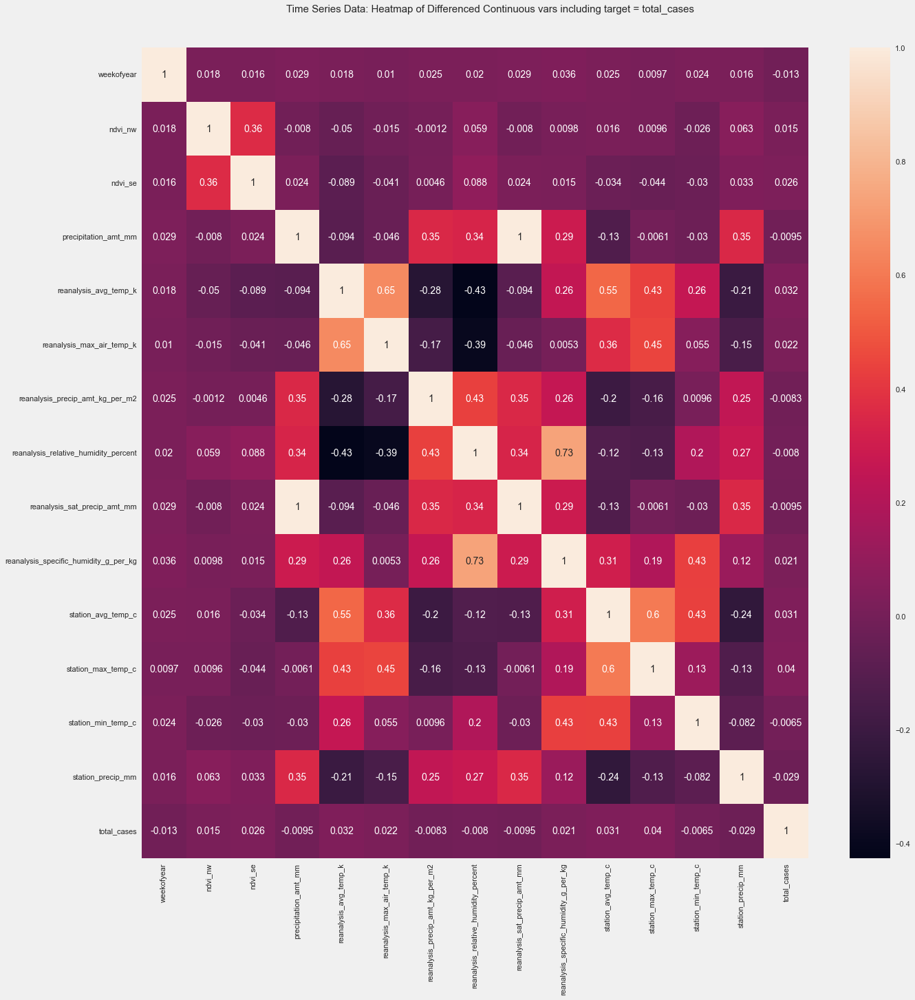

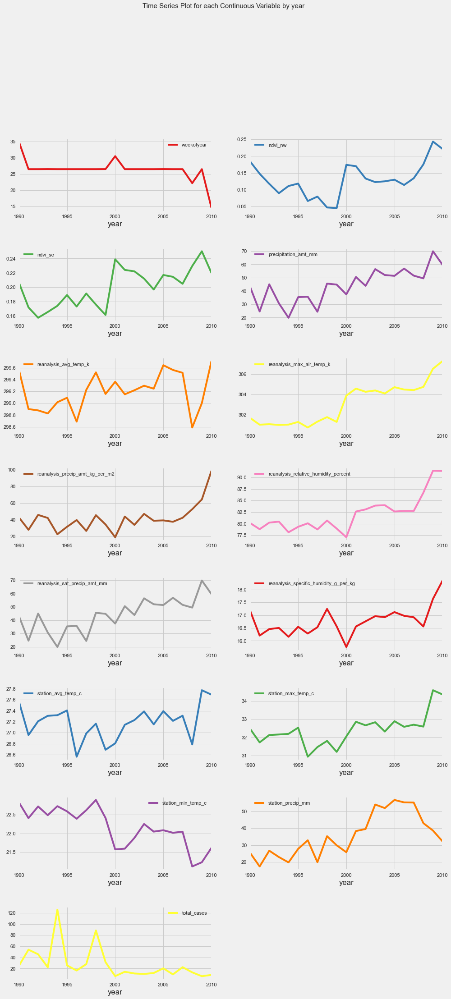

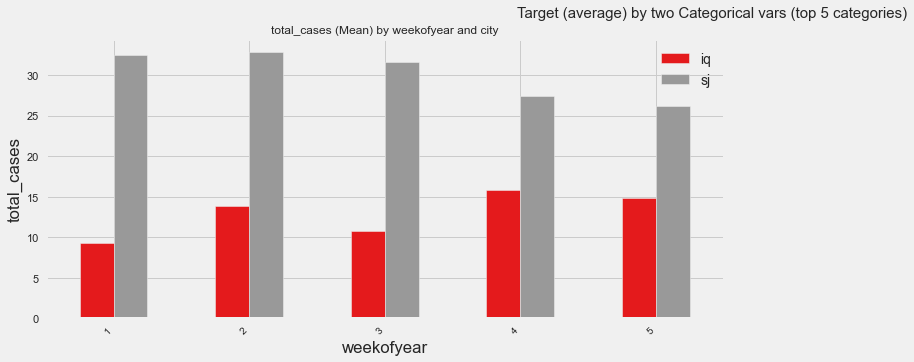

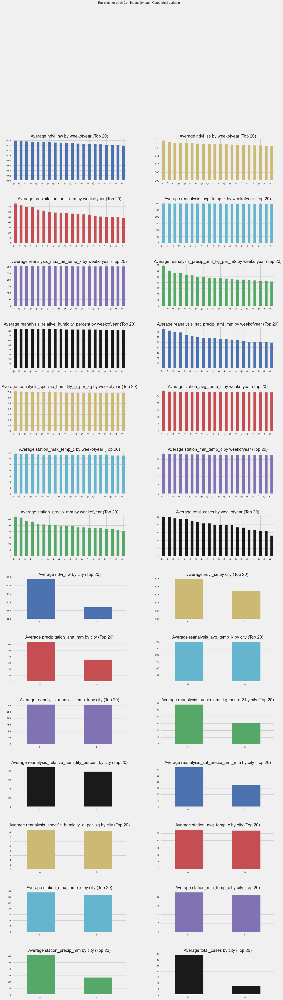

In [19]:
from autoviz.AutoViz_Class import AutoViz_Class
AutoViz_Class().AutoViz('', '','total_cases', df_input)

In [20]:
y=df_input["total_cases"]
x=df_input.drop('total_cases',axis=1)
x_train, x_test, Y_train, Y_test = train_test_split(x, y, test_size=0.33, random_state=42)

In [21]:
x.dtypes

year                                       int64
weekofyear                                 int64
ndvi_nw                                  float64
ndvi_se                                  float64
precipitation_amt_mm                     float64
reanalysis_avg_temp_k                    float64
reanalysis_max_air_temp_k                float64
reanalysis_precip_amt_kg_per_m2          float64
reanalysis_relative_humidity_percent     float64
reanalysis_sat_precip_amt_mm             float64
reanalysis_specific_humidity_g_per_kg    float64
station_avg_temp_c                       float64
station_max_temp_c                       float64
station_min_temp_c                       float64
station_precip_mm                        float64
city                                      object
dtype: object

In [22]:
num_df=x.select_dtypes([np.number])
cat_df=x.select_dtypes([np.object])
num_df_test=df_test.select_dtypes([np.number])
cat_df_test=df_test.select_dtypes([np.object])
scalar=StandardScaler()
num_df.loc[:,num_df.columns.tolist()] = scalar.fit_transform(df_input.loc[:,num_df.columns.tolist()])
num_df_test.loc[:,num_df_test.columns.tolist()] = scalar.fit_transform(num_df_test.loc[:,num_df_test.columns.tolist()])
x=pd.concat([num_df,cat_df],axis=1)
df_test=pd.concat([num_df_test,cat_df_test],axis=1)
print(x.shape)
print(df_test.shape)

(1456, 16)
(416, 16)


Encoding **city**


<AxesSubplot:ylabel='Frequency'>

(1456, 17)


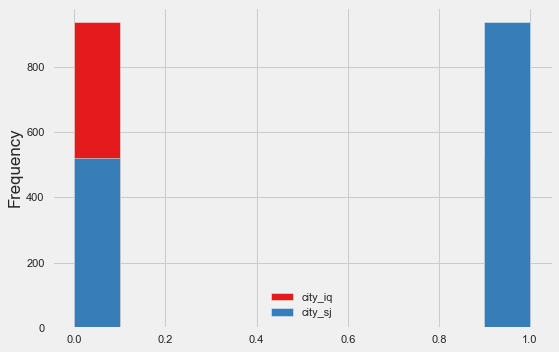

In [23]:

model_oh = OneHotEncoder(handle_unknown="ignore", sparse=False)
for c in x.select_dtypes("object").columns:
        
        print(f"Encoding **{c}**")  # which column
        matrix = model_oh.fit_transform(
            x[[c]]
        )  # get a matrix of new features and values
        names = model_oh.get_feature_names_out()  # get names for these features
        df_oh = pd.DataFrame(
            data=matrix, columns=names, index=x.index
        )  # create df of these new features
        display(df_oh.plot.hist())
        df_input = pd.concat([x, df_oh], axis=1)  # concat with existing df
        df_input.drop(
            c, axis=1, inplace=True
        )


        
df_input.dtypes
x=df_input
print(df_input.shape)


Encoding **city**


<AxesSubplot:ylabel='Frequency'>

(416, 17)


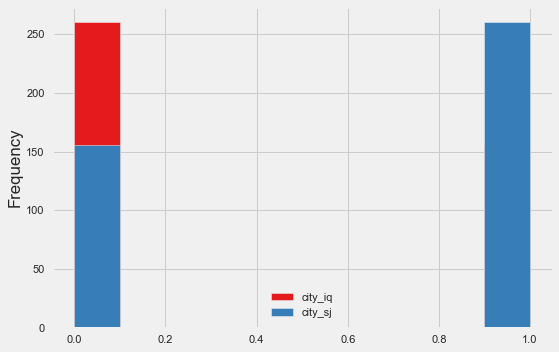

In [24]:
for c in df_test.select_dtypes("object").columns:
        print(f"Encoding **{c}**")  # which column
        matrix = model_oh.fit_transform(
            df_test[[c]]
        )  # get a matrix of new features and values
        names = model_oh.get_feature_names_out()  # get names for these features
        df_ohe = pd.DataFrame(
            data=matrix, columns=names, index=df_test.index
        )  # create df of these new features
        display(df_ohe.plot.hist())
        df_test = pd.concat([df_test, df_ohe], axis=1)  # concat with existing df
        df_test.drop(
            c, axis=1, inplace=True)
final_test=df_test
print(final_test.shape)

In [25]:
X_train, X_test, y_train, y_test = train_test_split(x, y, test_size=0.33, random_state=42)

In [62]:
y_train.shape

(975,)

# Hyperparameter Tunning to get best hyperparameters

In [69]:

from sklearn.model_selection import cross_val_score
def modelfit(alg, X_train,y_train, performCV=True, printFeatureImportance=True, cv_folds=5):
    #Fit the algorithm on the data
    alg.fit(X_train, y_train)
        
    #Predict training set:
    dtrain_predictions = alg.predict(X_train)
    
    
    #Perform cross-validation:
    if performCV:
        cv_score = cross_val_score(alg, X_train, y_train, cv=cv_folds, scoring='r2')
    
    #Print model report:
    print("\nModel Report")
    print("R2 : %.4g" % r2_score(y_train, dtrain_predictions))
    print("RSME Score (Train): %f" % mean_squared_error(y_train, dtrain_predictions))
    
    if performCV:
        print("CV Score : Mean - %.7g | Std - %.7g | Min - %.7g | Max - %.7g" % (np.mean(cv_score),np.std(cv_score),np.min(cv_score),np.max(cv_score)))
        
    #Print Feature Importance:
    if printFeatureImportance:
        feat_imp = pd.Series(alg.feature_importances_, X_train.columns.tolist()).sort_values(ascending=False)
        feat_imp.plot(kind='bar', title='Feature Importances')
        plt.ylabel('Feature Importance Score')

In [73]:
#Choose all predictors except target & IDcols
from sklearn.model_selection import GridSearchCV
predictors = [x for x in X_train.columns]
param_test1 = {'n_estimators':range(20,81,10)}
gsearch1 = GridSearchCV(estimator = GradientBoostingRegressor(learning_rate=0.05, min_samples_split=500,min_samples_leaf=50,max_depth=8,max_features='sqrt',subsample=0.8,random_state=10), 
param_grid = param_test1, scoring='r2',n_jobs=4, cv=5)
gsearch1.fit(X_train[predictors],y_train)
gsearch1.best_params_, gsearch1.best_score_

({'n_estimators': 80}, 0.19239841236705132)

In [74]:
param_test2 = {'max_depth':range(5,16,2), 'min_samples_split':range(200,1001,200)}
gsearch2 = GridSearchCV(estimator = GradientBoostingRegressor(learning_rate=0.05, n_estimators=80, max_features='sqrt', subsample=0.8, random_state=10), 
param_grid = param_test2, scoring='roc_auc',n_jobs=4, cv=5)
gsearch2.fit(X_train[predictors],y_train)
gsearch2.best_params_, gsearch2.best_score_

({'max_depth': 5, 'min_samples_split': 200}, nan)

In [75]:
param_test3 = {'min_samples_split':range(1000,2100,200), 'min_samples_leaf':range(30,71,10)}
gsearch3 = GridSearchCV(estimator = GradientBoostingRegressor(learning_rate=0.05, n_estimators=80,max_depth=5,max_features='sqrt', subsample=0.8, random_state=10), 
param_grid = param_test3, scoring='roc_auc',n_jobs=4, cv=5)
gsearch3.fit(X_train[predictors],y_train)
gsearch3.best_params_, gsearch3.best_score_

({'min_samples_leaf': 30, 'min_samples_split': 1000}, nan)


Model Report
R2 : 0.4672
RSME Score (Train): 893.828942
CV Score : Mean - 0.3296489 | Std - 0.03354481 | Min - 0.2777624 | Max - 0.3836358


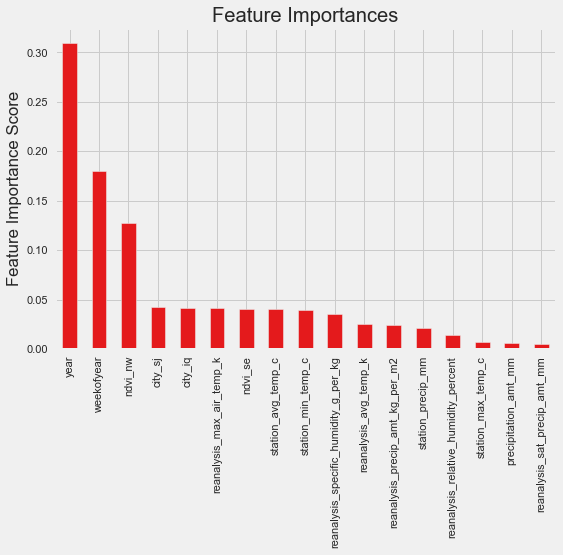

In [76]:
modelfit(gsearch2.best_estimator_, X_train,y_train) 


Model Report
R2 : 0.2619
RSME Score (Train): 1238.327279
CV Score : Mean - 0.1923984 | Std - 0.01178045 | Min - 0.1796661 | Max - 0.2106399


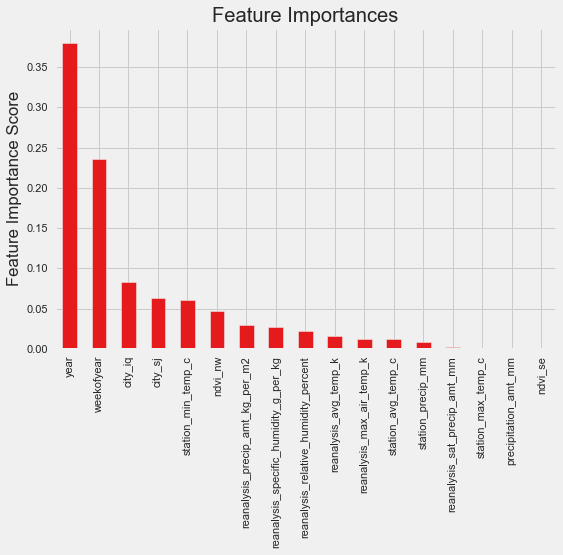

In [77]:
modelfit(gsearch1.best_estimator_, X_train,y_train) 

# Apply Model
1. GBDT is best model for non linear data and high bias dataset
2. Applied GBDT with best hyperparameters to get the o/p
3. We can fine tune the model by using multiple hyperparameter technique

In [27]:
 sklearn_gbm = GradientBoostingRegressor(
    n_estimators=100, 
    learning_rate=0.05, 
    max_depth=5
)
sklearn_gbm.fit(X_train, y_train)
sklearn_gbm_rmse = mean_squared_error(y_test, sklearn_gbm.predict(X_test), squared=False)
print(f"Scikit-learn GBM RMSE:{sklearn_gbm_rmse:.15f}") 

Scikit-learn GBM RMSE:26.256417947598930


In [31]:
sklearn_gbm_r2 = r2_score(y_test, sklearn_gbm.predict(X_test))
print(f"Scikit-learn GBM R2:{sklearn_gbm_r2:.15f}") 

Scikit-learn GBM R2:0.705432851826896


# Prediction test datasets and extract the output

In [32]:
y_pred_final=sklearn_gbm.predict(df_test)
df_pred_final = pd.DataFrame(y_pred_final, columns=['total_cases_pred'])

In [33]:
result_df=pd.concat([result_test,df_pred_final],axis=1)

In [34]:
result_df

,city,year,weekofyear,week_start_date,ndvi_ne,ndvi_nw,ndvi_se,ndvi_sw,precipitation_amt_mm,reanalysis_air_temp_k,...,reanalysis_relative_humidity_percent,reanalysis_sat_precip_amt_mm,reanalysis_specific_humidity_g_per_kg,reanalysis_tdtr_k,station_avg_temp_c,station_diur_temp_rng_c,station_max_temp_c,station_min_temp_c,station_precip_mm,total_cases_pred
0,sj,2008,18,2008-04-29,-0.018900,-0.018900,0.102729,0.091200,78.60,298.492857,...,78.781429,78.60,15.918571,3.128571,26.528571,7.057143,33.3,21.7,75.2,17.671370
1,sj,2008,19,2008-05-06,-0.018000,-0.012400,0.082043,0.072314,12.56,298.475714,...,78.230000,12.56,15.791429,2.571429,26.071429,5.557143,30.0,22.2,34.3,20.084645
2,sj,2008,20,2008-05-13,-0.001500,0.126803,0.151083,0.091529,3.66,299.455714,...,78.270000,3.66,16.674286,4.428571,27.928571,7.785714,32.8,22.8,3.0,21.974217
3,sj,2008,21,2008-05-20,0.126050,-0.019867,0.124329,0.125686,0.00,299.690000,...,73.015714,0.00,15.775714,4.342857,28.057143,6.271429,33.3,24.4,0.3,24.170950
4,sj,2008,22,2008-05-27,0.056800,0.039833,0.062267,0.075914,0.76,299.780000,...,74.084286,0.76,16.137143,3.542857,27.614286,7.085714,33.3,23.3,84.1,18.344276
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
411,iq,2013,22,2013-05-28,0.301471,0.380029,0.280629,0.383186,41.12,297.774286,...,89.990000,41.12,17.185714,10.100000,27.400000,9.050000,32.6,21.8,33.0,6.266886
412,iq,2013,23,2013-06-04,0.247600,0.296343,0.285371,0.350357,71.52,297.167143,...,93.891429,71.52,17.448571,9.657143,27.520000,10.720000,33.8,21.4,68.0,4.373541
413,iq,2013,24,2013-06-11,0.238729,0.251029,0.252586,0.249771,78.96,295.831429,...,94.967143,78.96,16.410000,7.385714,27.200000,10.075000,32.6,21.6,93.2,3.375985
414,iq,2013,25,2013-06-18,0.310429,0.302700,0.406614,0.403943,39.54,295.778571,...,89.057143,39.54,15.137143,8.228571,26.700000,8.480000,32.2,21.8,34.1,3.229112


In [35]:
result_df=result_df[['year','weekofyear','city','total_cases_pred']]

In [36]:
result_df

,year,weekofyear,city,total_cases_pred
0,2008,18,sj,17.671370
1,2008,19,sj,20.084645
2,2008,20,sj,21.974217
3,2008,21,sj,24.170950
4,2008,22,sj,18.344276
...,...,...,...,...
411,2013,22,iq,6.266886
412,2013,23,iq,4.373541
413,2013,24,iq,3.375985
414,2013,25,iq,3.229112


In [37]:
result_df[result_df.select_dtypes(include=np.number).columns.tolist()]=result_df.select_dtypes(include=np.number).applymap(lambda x: int(round(x, 0)))

In [38]:
result_df

,year,weekofyear,city,total_cases_pred
0,2008,18,sj,18
1,2008,19,sj,20
2,2008,20,sj,22
3,2008,21,sj,24
4,2008,22,sj,18
...,...,...,...,...
411,2013,22,iq,6
412,2013,23,iq,4
413,2013,24,iq,3
414,2013,25,iq,3


In [40]:
result_df.to_csv("./final_data.csv")